In [1]:
from osgeo import gdal
import os
from pylandsat import Product
from glob import glob
import rasterio
from rasterio.plot import show
from sklearn.metrics import r2_score
from matplotlib import pyplot as plt
import osgeo_utils.gdal_merge
import osgeo_utils.gdal_pansharpen
import shutil
import numpy as np

c:\Users\HOME\anaconda3\Lib\site-packages\rasterio\path.py:15: RasterioDeprecationWarning: rasterio.path will be removed in version 1.4.
  warnings.warn(


Method to display TIFF image

In [ ]:
def display_tif(tif_path: str, title: str) -> None:
    try:
        with rasterio.open(tif_path) as image:
            plt.figure(figsize=(10,12))
            show(image.read(), adjust=True, title=title)
    except Exception as e:
        print(f"Failed to open tif file:\n{e}")

Identificators of landsat data

In [5]:
ids = ["LC08_L1TP_182025_20190830_20190903_01_T1", "LC08_L1TP_182026_20190830_20190903_01_T1"]
pansharpen_methods = ["nearest", "bilinear", "cubic", "cubicspline", "lanczos", "average"]

Working directories

In [6]:
landsat_dir = "landsat"
landsat_output_dir = "landsat_results"

Methods to download Landsat data in working directory using pylandsat module

In [ ]:
def has_all_bands(directory: str, bands: list) -> bool:
    for band in bands:
        if not glob(os.path.join(directory, f"*_{band}.TIF")):
            print(f"Band {band} is missing in {directory}.")
            return False
    return True

def remove_directory(path: str) -> None:
    if os.path.exists(path):
        try:
            shutil.rmtree(path)
            print(f"Removed incomplete directory: {path}")
        except Exception as e:
            print(f"Failed to remove directory {path}: {e}")

def download_landsat(dir: str, ids: list, bandsToCheck: list = None) -> None:
    for id in ids:
        id_dir = os.path.join(dir, id)
        if bandsToCheck and os.path.exists(id_dir):
            if not has_all_bands(id_dir, bandsToCheck):
                remove_directory(id_dir)
            else:
                print(f"All bands found for {id}. Skipping download.")
                continue

        print(f"Downloading files for {id}...")
        try:
            product = Product(id)
            product.download(out_dir=dir, progressbar=True)
            print(f"Download completed for {id}")
        except Exception as e:
            print(f"Failed to download {id}: {e}")

In [13]:
download_landsat(landsat_dir, ids, ['B8','B4','B3','B2'])

LC08_L1TP_182025_20190830_20190903_01_T1_B1.TIF: : 65.0MB [00:17, 3.62MB/s]                          
LC08_L1TP_182025_20190830_20190903_01_T1_B2.TIF: : 67.1MB [00:19, 3.39MB/s]                          
LC08_L1TP_182025_20190830_20190903_01_T1_B3.TIF: : 71.3MB [00:21, 3.31MB/s]                          
LC08_L1TP_182025_20190830_20190903_01_T1_B4.TIF: : 76.5MB [00:24, 3.09MB/s]                          
LC08_L1TP_182025_20190830_20190903_01_T1_B5.TIF: : 90.2MB [00:23, 3.80MB/s]                          
LC08_L1TP_182025_20190830_20190903_01_T1_B6.TIF: : 89.1MB [00:23, 3.83MB/s]                          
LC08_L1TP_182025_20190830_20190903_01_T1_B7.TIF: : 86.0MB [00:23, 3.65MB/s]                          
LC08_L1TP_182025_20190830_20190903_01_T1_B8.TIF: : 285MB [01:10, 4.05MB/s]                          
LC08_L1TP_182025_20190830_20190903_01_T1_B9.TIF: : 45.1MB [00:13, 3.36MB/s]                          
LC08_L1TP_182025_20190830_20190903_01_T1_B10.TIF: : 66.1MB [00:19, 3.42MB/s]       

Download completed for LC08_L1TP_182025_20190830_20190903_01_T1


LC08_L1TP_182026_20190830_20190903_01_T1_B1.TIF: : 66.1MB [00:20, 3.27MB/s]                          
LC08_L1TP_182026_20190830_20190903_01_T1_B2.TIF: : 69.2MB [00:18, 3.74MB/s]                          
LC08_L1TP_182026_20190830_20190903_01_T1_B3.TIF: : 73.4MB [00:18, 4.01MB/s]                          
LC08_L1TP_182026_20190830_20190903_01_T1_B4.TIF: : 78.6MB [00:19, 3.94MB/s]                          
LC08_L1TP_182026_20190830_20190903_01_T1_B5.TIF: : 90.2MB [00:22, 3.95MB/s]                          
LC08_L1TP_182026_20190830_20190903_01_T1_B6.TIF: : 87.0MB [00:25, 3.35MB/s]                          
LC08_L1TP_182026_20190830_20190903_01_T1_B7.TIF: : 84.9MB [00:27, 3.04MB/s]                          
LC08_L1TP_182026_20190830_20190903_01_T1_B8.TIF: : 289MB [01:18, 3.69MB/s]                          
LC08_L1TP_182026_20190830_20190903_01_T1_B9.TIF: : 45.1MB [00:11, 3.85MB/s]                          
LC08_L1TP_182026_20190830_20190903_01_T1_B10.TIF: : 67.1MB [00:17, 3.85MB/s]       

Download completed for LC08_L1TP_182026_20190830_20190903_01_T1


Method to concatenate rgb bands of each image

In [25]:
def concatenate_rgb_bands(bands_dir: str, output_dir: str) -> None:
    bands = ['B4','B3','B2']
    command = ["","-separate","-o", os.path.join(output_dir,"concatenated.TIF")]
    os.makedirs(output_dir, exist_ok=True)
    for band in bands:
        band_files = glob(os.path.join(bands_dir,f"*_{band}.TIF"))
        if band_files:
            command.append(band_files[0])
        else:
            print(f"Failed to find band {band}. Concatenation failed.")
            return
    try:
        osgeo_utils.gdal_merge.gdal_merge(command)
        print("Concatenation was successful.")
    except Exception as e:
        print(f"Failed to concatenate:\n{e}")

Concatenating RGB bands for LC08_L1TP_182025_20190830_20190903_01_T1...
Concatenation was successful.


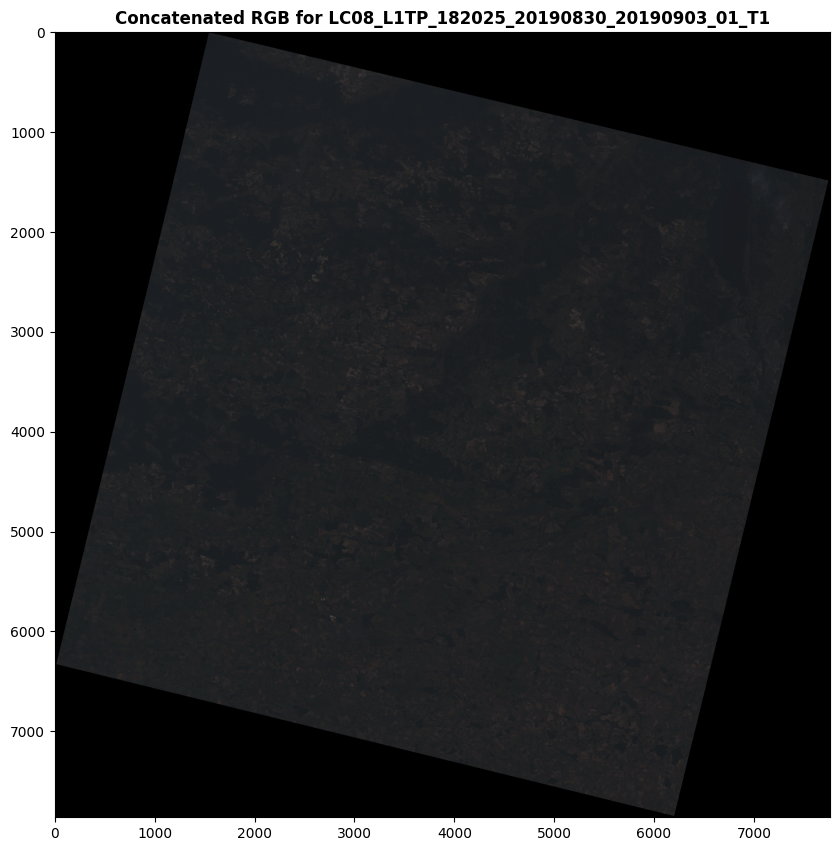

Concatenating RGB bands for LC08_L1TP_182026_20190830_20190903_01_T1...
Concatenation was successful.


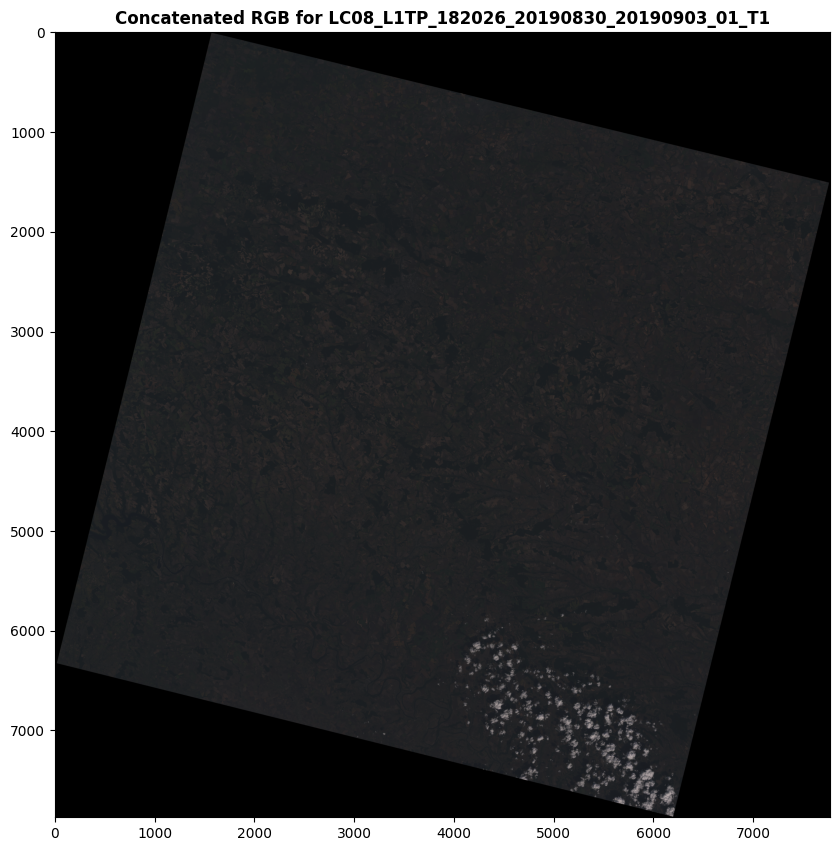

In [26]:
for id in ids:
    print(f"Concatenating RGB bands for {id}...")
    concatenate_rgb_bands(os.path.join(landsat_dir, id), os.path.join(landsat_output_dir, id))
    display_tif(os.path.join(landsat_output_dir, id, "concatenated.TIF"), f"Concatenated RGB for {id}")

Metho to translate rgb and panchromatic images to 60m and 30m resolution respectively

In [ ]:
def translate_image(file: str, output_dir: str, res: int) -> str:
    output = None
    try:
        dataset = gdal.Open(file)
        output = os.path.join(output_dir, file.split('\\')[-1][:-4] + "_translated.TIF")
        dataset = gdal.Translate(output, dataset, xRes = res, yRes= res)
        print(f"{file} was successfuly translated.")
    except Exception as e:
        print(f"Failed to translate {file}.")
    return output

Translating RGB bands concatenated for LC08_L1TP_182025_20190830_20190903_01_T1...
landsat_results\LC08_L1TP_182025_20190830_20190903_01_T1\concatenated.TIF was successfuly translated.


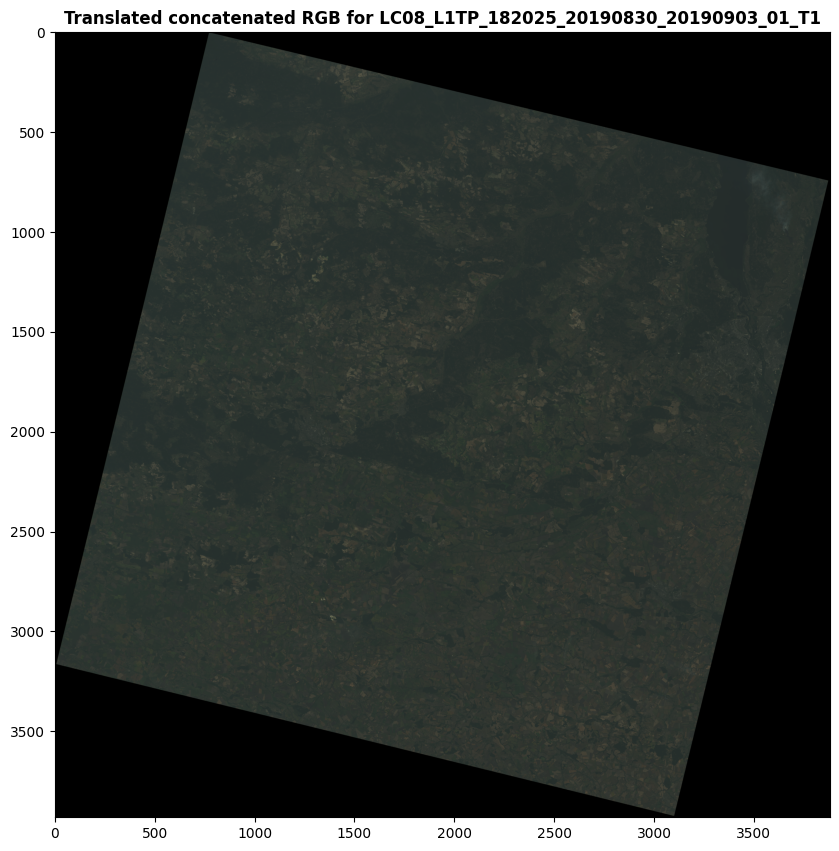

Translating B8 band for LC08_L1TP_182025_20190830_20190903_01_T1...
landsat\LC08_L1TP_182025_20190830_20190903_01_T1\LC08_L1TP_182025_20190830_20190903_01_T1_B8.TIF was successfuly translated.


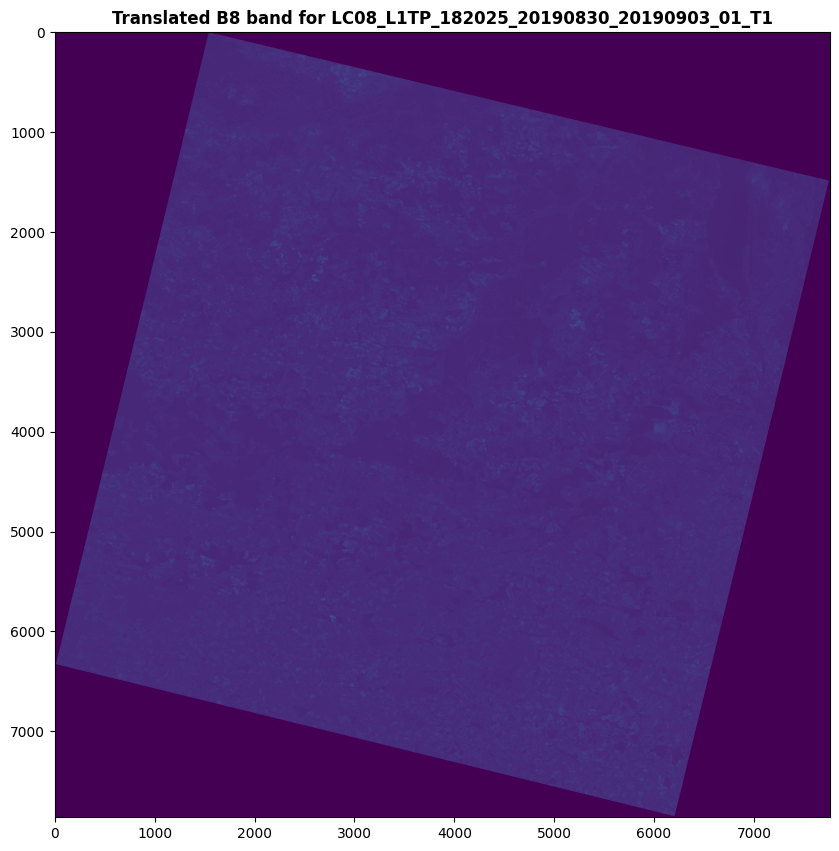

Translating RGB bands concatenated for LC08_L1TP_182026_20190830_20190903_01_T1...
landsat_results\LC08_L1TP_182026_20190830_20190903_01_T1\concatenated.TIF was successfuly translated.


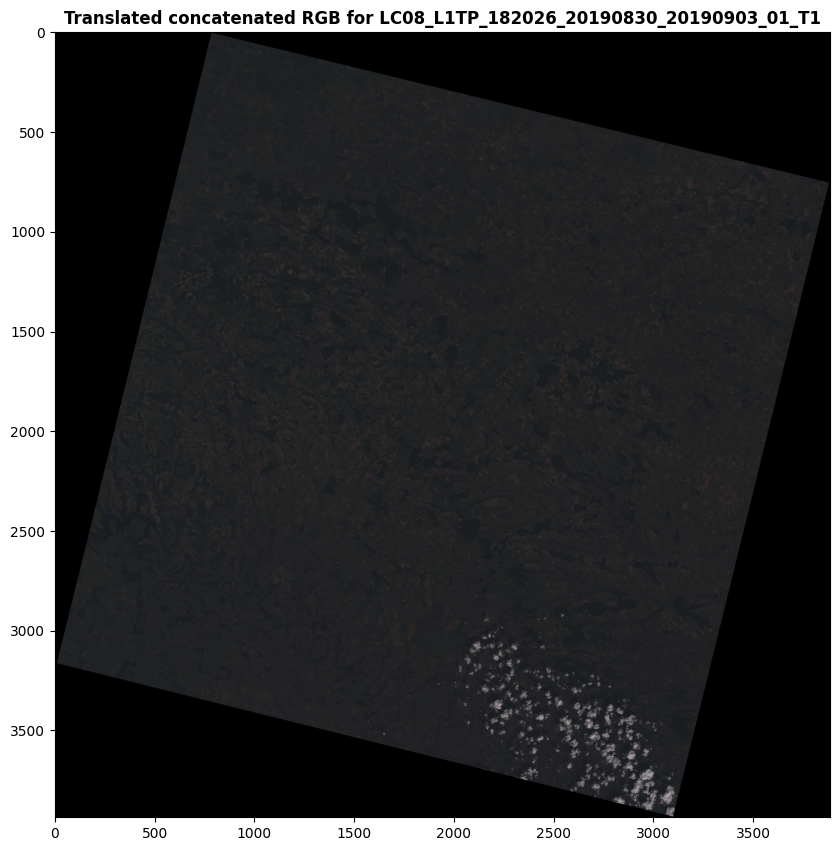

Translating B8 band for LC08_L1TP_182026_20190830_20190903_01_T1...
landsat\LC08_L1TP_182026_20190830_20190903_01_T1\LC08_L1TP_182026_20190830_20190903_01_T1_B8.TIF was successfuly translated.


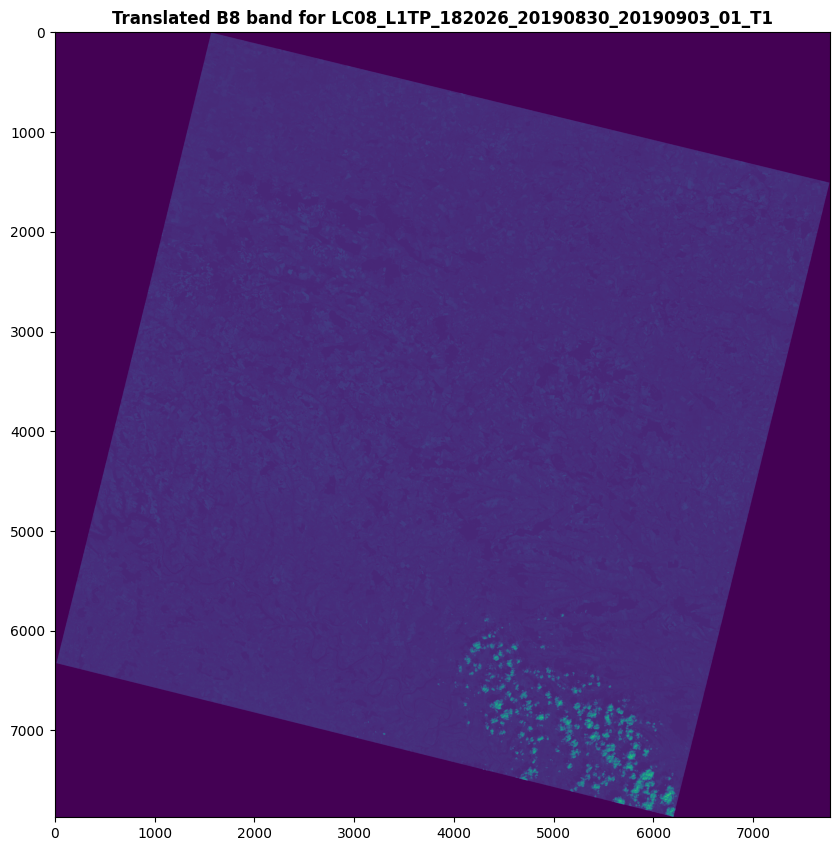

In [ ]:
translated_pairs = {}
for id in ids:
    id_dir = os.path.join(landsat_output_dir, id)
    rgb_image = os.path.join(id_dir,"concatenated.TIF")
    if not os.path.exists(rgb_image):
        print(f"RGB bands concatenated not found for {id}.")
        continue
    print(f"Translating concatenated RGB bands  for {id}...")
    rgb_translated = translate_image(rgb_image, id_dir, 60)
    if rgb_translated: 
        display_tif(rgb_translated, f"Translated concatenated RGB for {id}")
    
    b8_band = glob(os.path.join(landsat_dir,id,"*_B8.TIF"))
    if b8_band:
        print(f"Translating B8 band for {id}...")
        b8_translated = translate_image(b8_band[0], id_dir, 30)
        if b8_translated:
            display_tif(b8_translated,f"Translated B8 band for {id}")
    else:
        print(f"B8 band not found for {id}.")
        continue
    translated_pairs[id] = [rgb_translated, b8_translated]

Pansharpening general image using different pansharpem methods

Pansharpening for LC08_L1TP_182025_20190830_20190903_01_T1...
Pansharpening using nearest method...
Successfuly pansharpened with nearest method for LC08_L1TP_182025_20190830_20190903_01_T1.


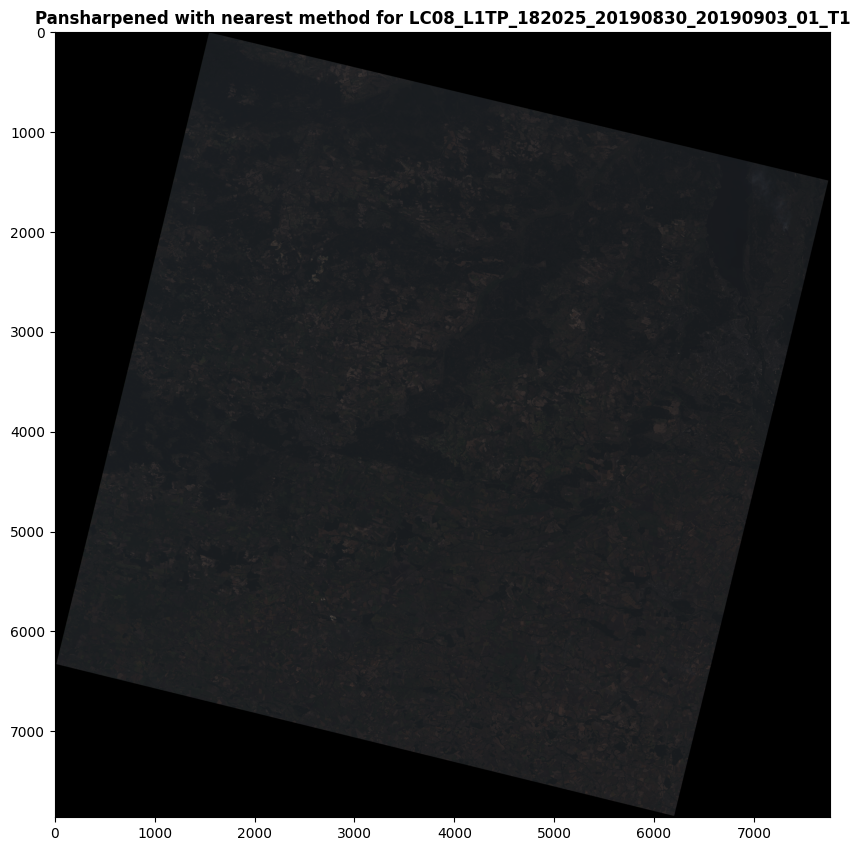

Pansharpening using bilinear method...
Successfuly pansharpened with bilinear method for LC08_L1TP_182025_20190830_20190903_01_T1.


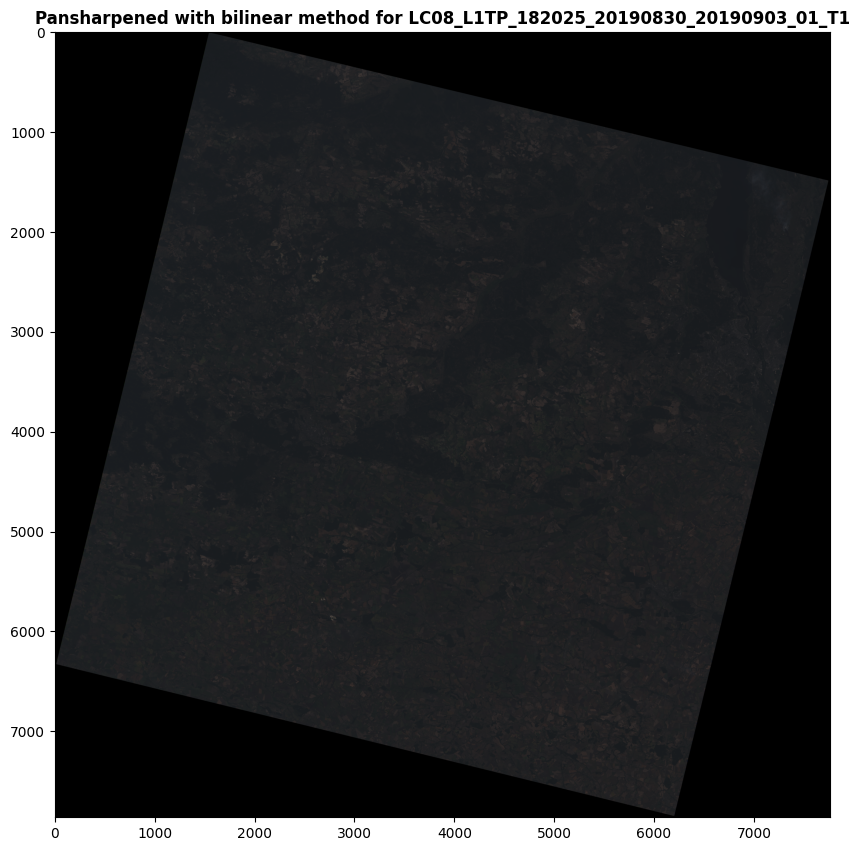

Pansharpening using cubic method...
Successfuly pansharpened with cubic method for LC08_L1TP_182025_20190830_20190903_01_T1.


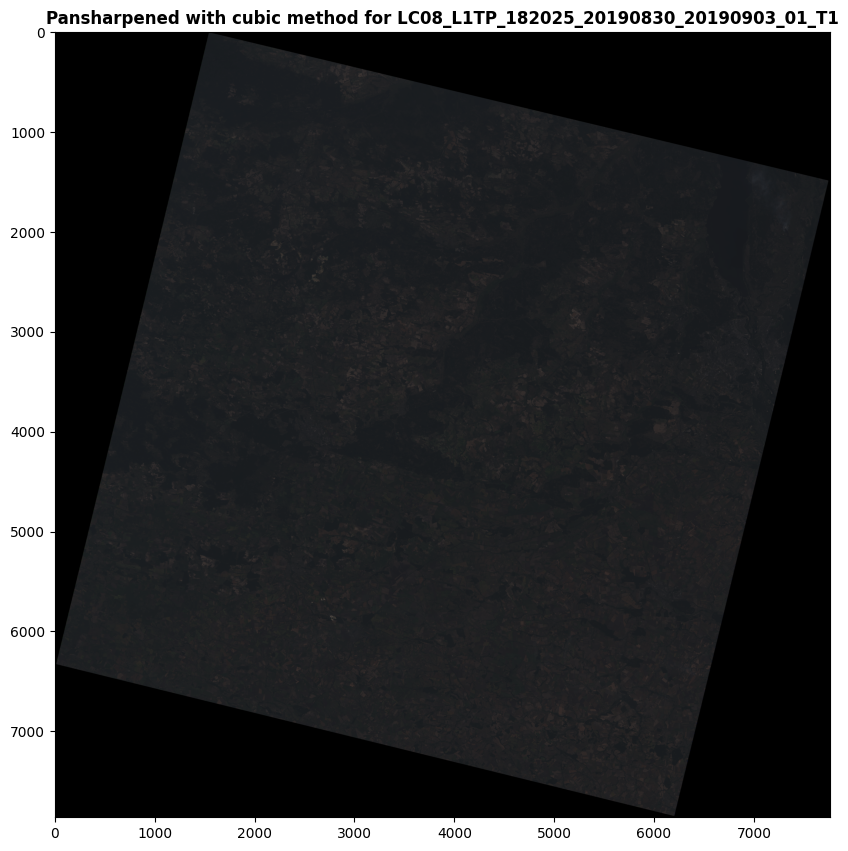

Pansharpening using cubicspline method...
Successfuly pansharpened with cubicspline method for LC08_L1TP_182025_20190830_20190903_01_T1.


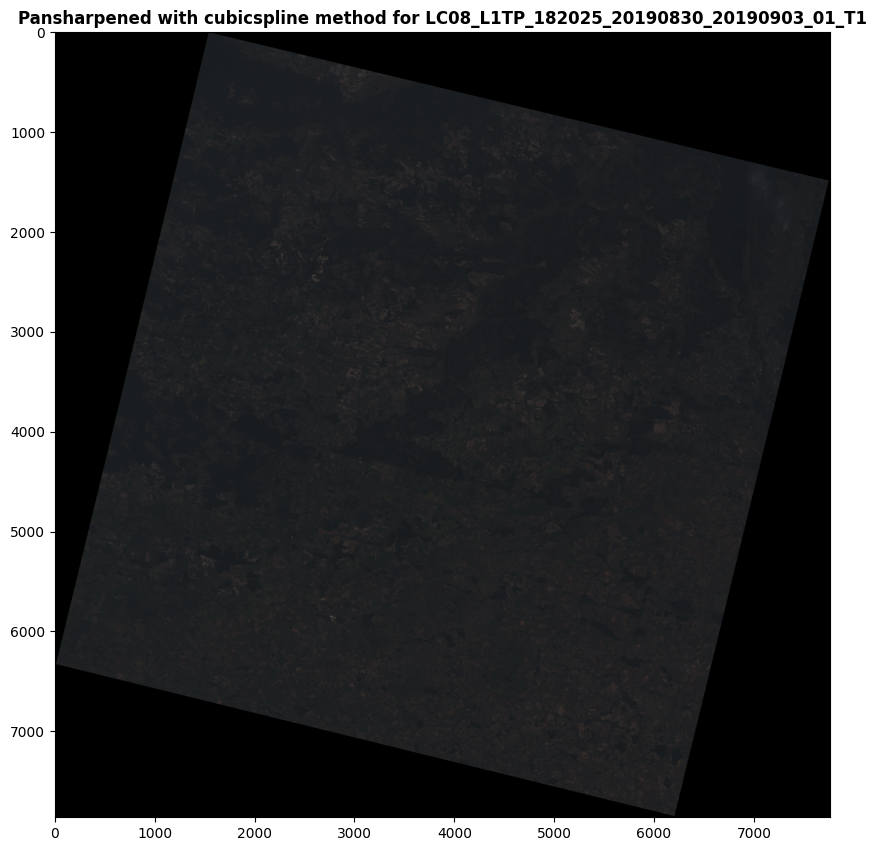

Pansharpening using lanczos method...
Successfuly pansharpened with lanczos method for LC08_L1TP_182025_20190830_20190903_01_T1.


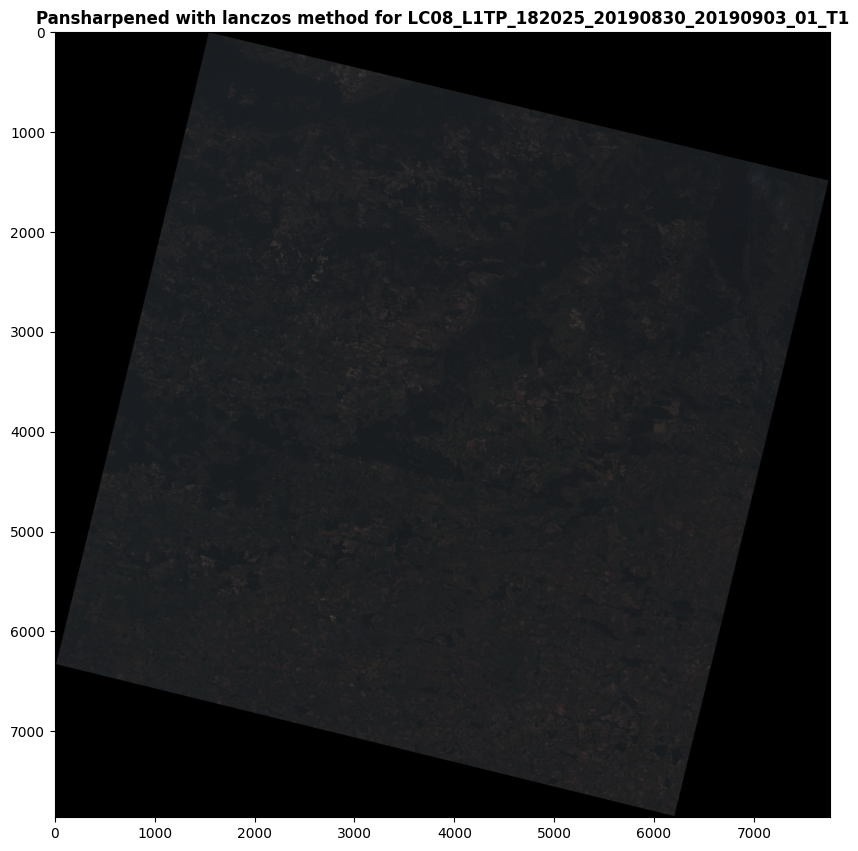

Pansharpening using average method...
Successfuly pansharpened with average method for LC08_L1TP_182025_20190830_20190903_01_T1.


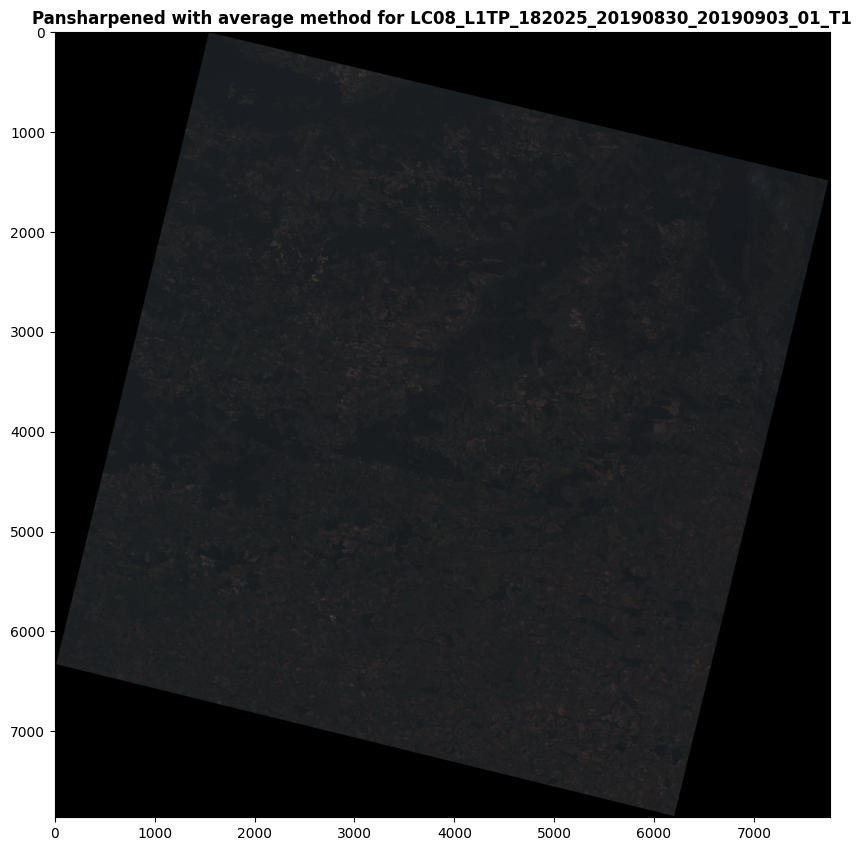

Pansharpening for LC08_L1TP_182026_20190830_20190903_01_T1...
Pansharpening using nearest method...
Successfuly pansharpened with nearest method for LC08_L1TP_182026_20190830_20190903_01_T1.


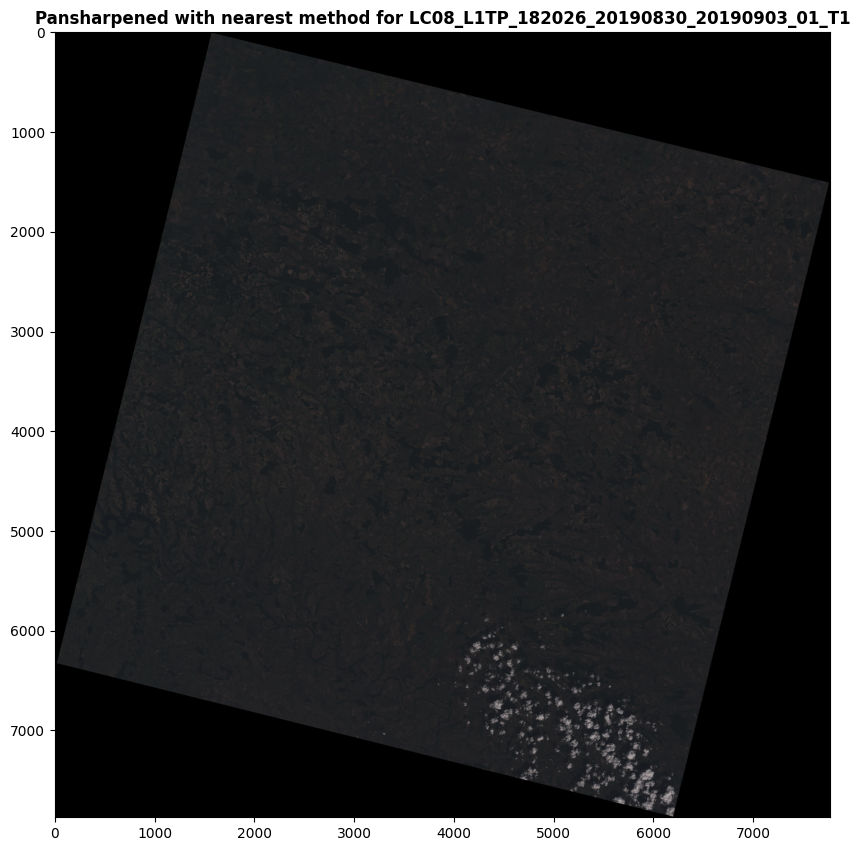

Pansharpening using bilinear method...
Successfuly pansharpened with bilinear method for LC08_L1TP_182026_20190830_20190903_01_T1.


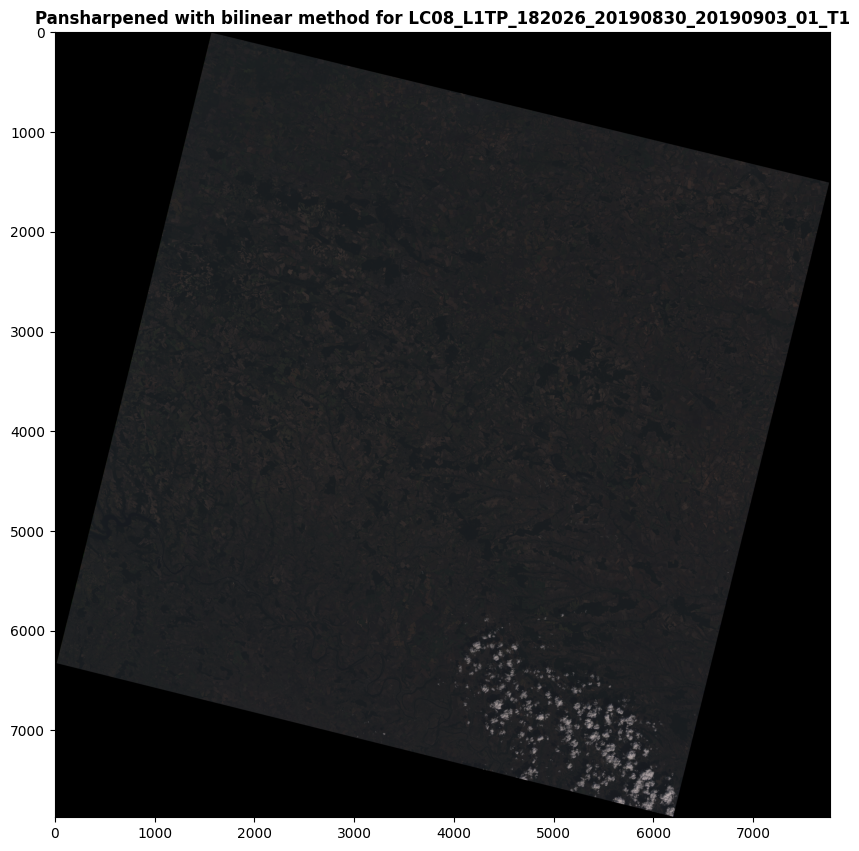

Pansharpening using cubic method...
Successfuly pansharpened with cubic method for LC08_L1TP_182026_20190830_20190903_01_T1.


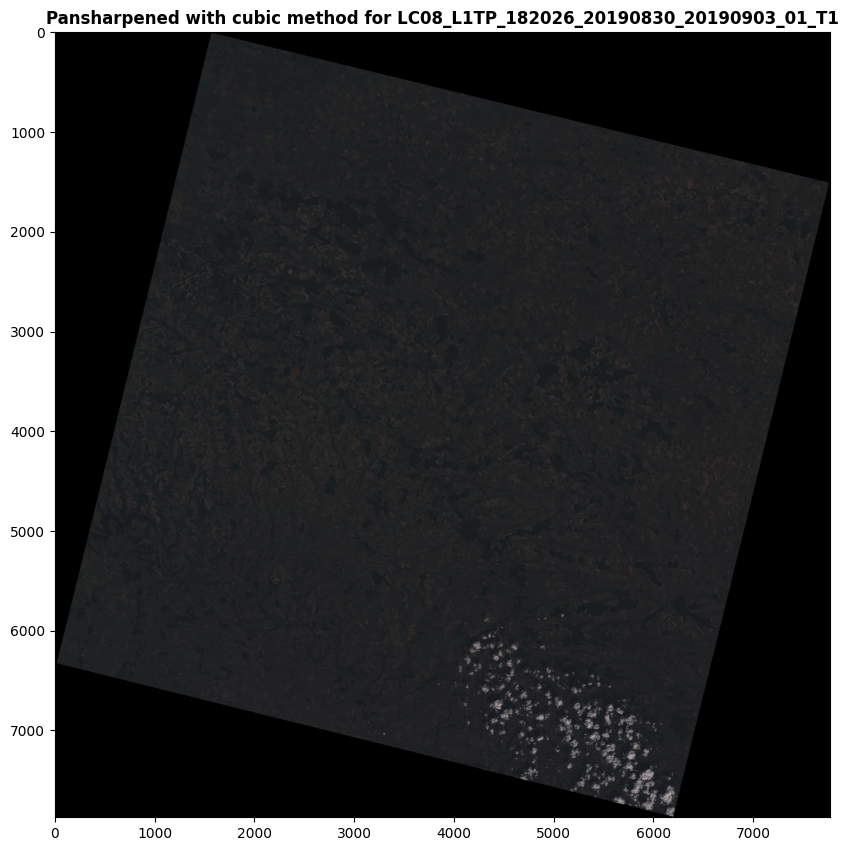

Pansharpening using cubicspline method...
Successfuly pansharpened with cubicspline method for LC08_L1TP_182026_20190830_20190903_01_T1.


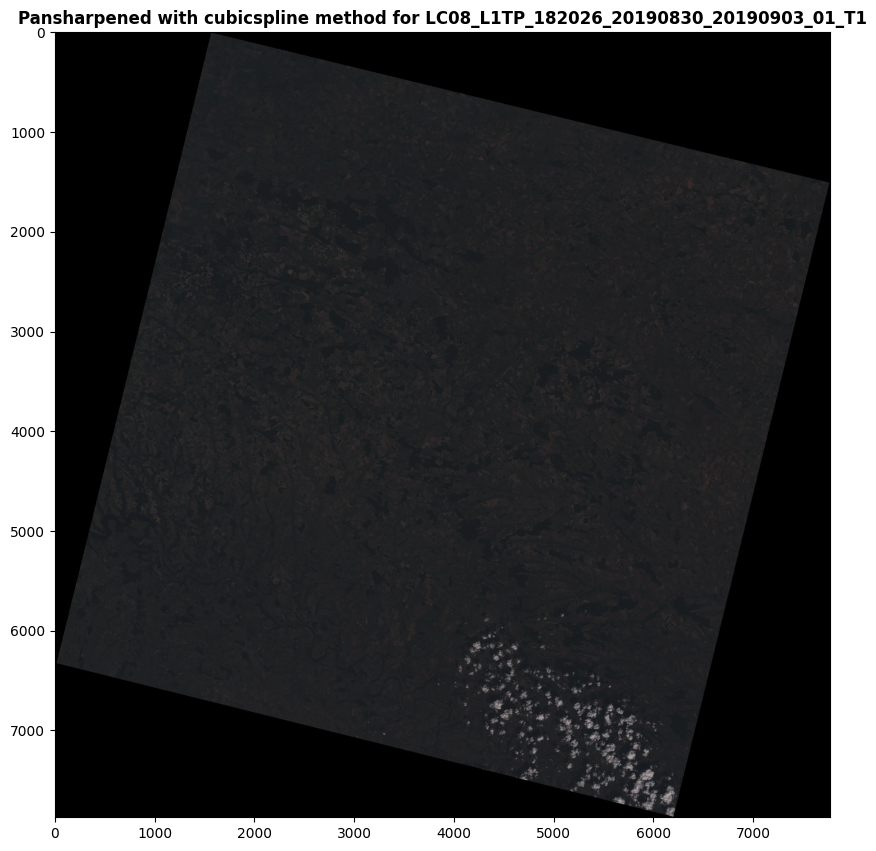

Pansharpening using lanczos method...
Successfuly pansharpened with lanczos method for LC08_L1TP_182026_20190830_20190903_01_T1.


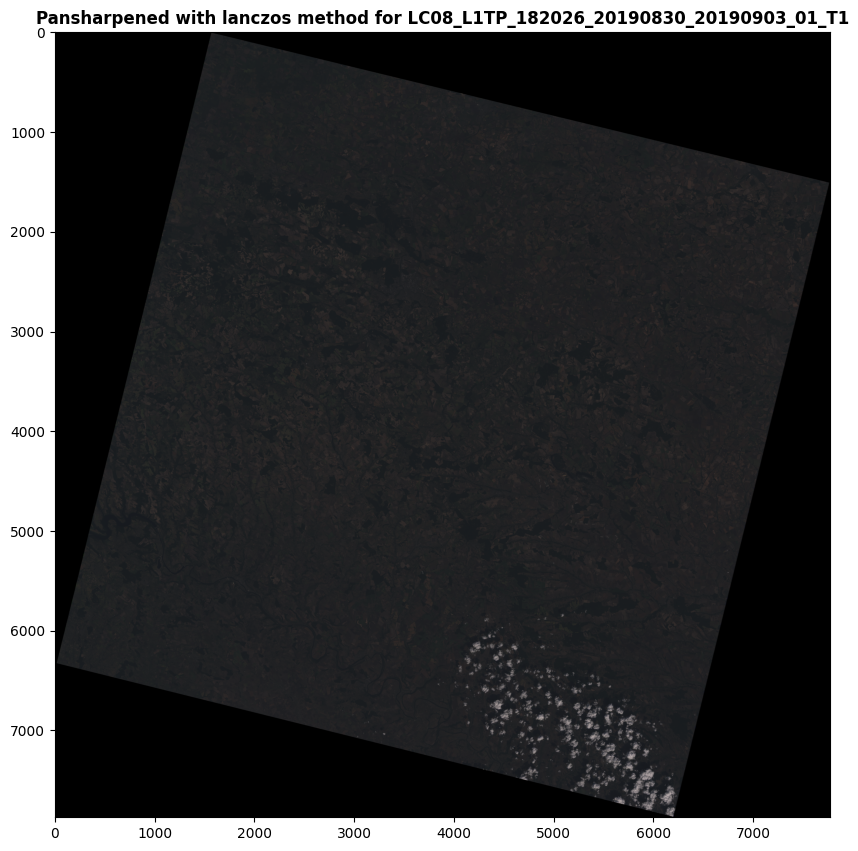

Pansharpening using average method...
Successfuly pansharpened with average method for LC08_L1TP_182026_20190830_20190903_01_T1.


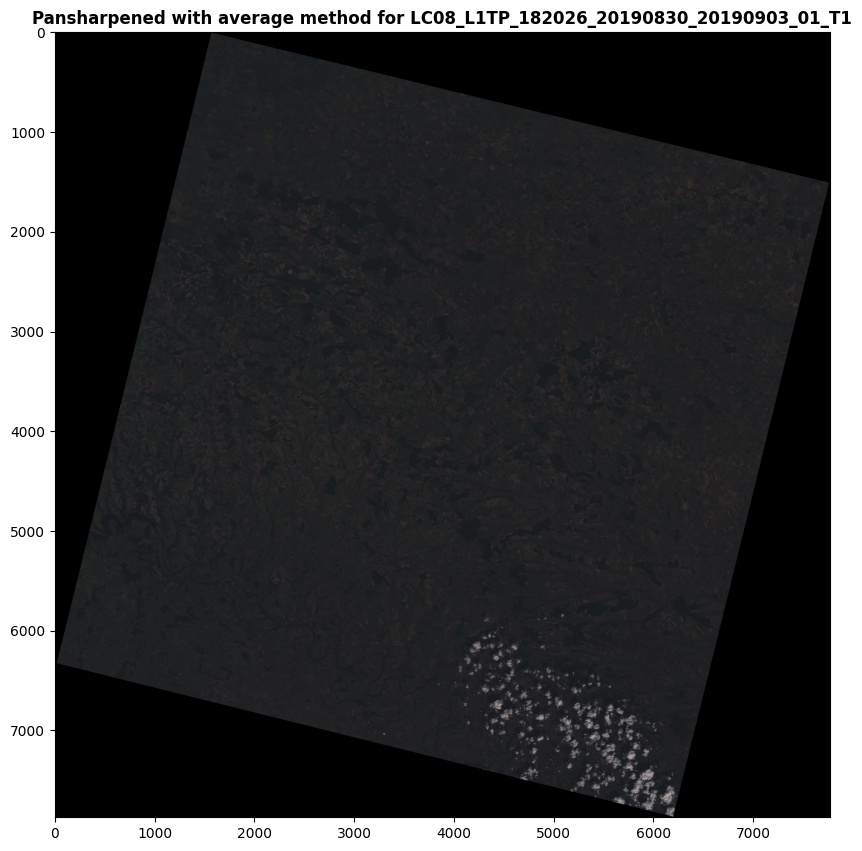

In [20]:
for id, file_paths in translated_pairs.items():
    print(f"Pansharpening for {id}...")
    for method in pansharpen_methods:
        print(f"Pansharpening using {method} method...")
        dest = os.path.join(landsat_output_dir, id, f"{method}.tif")
        res = osgeo_utils.gdal_pansharpen.gdal_pansharpen(
            pan_name = file_paths[1],
            spectral_names = [file_paths[0]],
            band_nums = [1, 2, 3],
            dst_filename = dest,
            resampling = method
        )
        if res == 0:
            print(f"Successfuly pansharpened {id} with {method} method.")
            display_tif(dest, f"Pansharpened {id} with {method} method")
        else:
            print(f"Failed to pansharpen {id} with {method} method.")

Calculating pansharpening methods efficiency by comparing two images (original concatenated RGB and pansharpened image) using R-square coefficient from sklearn.metrics module

In [ ]:
def read_flattened_image(path: str) -> np.ndarray:
    try:
        with rasterio.open(path) as src:
            return src.read().flatten()
    except Exception as e:
        print(f"Failed to read image {path}\nError: {e}")
        return None

def calculate_r2_for_methods(id: str, id_dir: str, rgb_image_path: str, methods: list) -> None:
    original_image = read_flattened_image(rgb_image_path)
    if original_image is None:
        print(f"Skipping ID {id}: original RGB image not readable.")
        return
    
    for method in methods:
        method_path = os.path.join(id_dir, f"{method}.tif")
        if not os.path.exists(method_path):
            print(f"Method image not found for {method} in {id}. Skipping.")
            continue

        method_image = read_flattened_image(method_path)
        if method_image is None:
            continue

        score = r2_score(original_image, method_image)
        print(f"[{id}] R² score for method '{method}': {score:.4f}")

def evaluate_r2_scores(ids: list, output_dir: str, methods: list) -> None:
    for id in ids:
        print(f"\nEvaluating R² scores for {id}...")
        id_dir = os.path.join(output_dir, id)
        rgb_path = os.path.join(id_dir, "concatenated.TIF")
        if os.path.exists(rgb_path):
            calculate_r2_for_methods(id, id_dir, rgb_path, methods)
        else:
            print(f"No RGB image found for {id}. Skipping.")

In [23]:
evaluate_r2_scores(ids=ids, output_dir=landsat_output_dir, methods=pansharpen_methods)


Evaluating R² scores for LC08_L1TP_182025_20190830_20190903_01_T1...
[LC08_L1TP_182025_20190830_20190903_01_T1] R² score for method 'nearest': 0.9944
[LC08_L1TP_182025_20190830_20190903_01_T1] R² score for method 'bilinear': 0.9949
[LC08_L1TP_182025_20190830_20190903_01_T1] R² score for method 'cubic': 0.9944
[LC08_L1TP_182025_20190830_20190903_01_T1] R² score for method 'cubicspline': 0.9928
[LC08_L1TP_182025_20190830_20190903_01_T1] R² score for method 'lanczos': 0.9940
[LC08_L1TP_182025_20190830_20190903_01_T1] R² score for method 'average': 0.9949

Evaluating R² scores for LC08_L1TP_182026_20190830_20190903_01_T1...
[LC08_L1TP_182026_20190830_20190903_01_T1] R² score for method 'nearest': 0.9952
[LC08_L1TP_182026_20190830_20190903_01_T1] R² score for method 'bilinear': 0.9958
[LC08_L1TP_182026_20190830_20190903_01_T1] R² score for method 'cubic': 0.9953
[LC08_L1TP_182026_20190830_20190903_01_T1] R² score for method 'cubicspline': 0.9938
[LC08_L1TP_182026_20190830_20190903_01_T1] R